In [19]:
%load_ext autoreload
%autoreload 2

import sys
sys.path.append('../')

from main import load_and_prepare_sessions
from processing.session_sampling import MiceAnalysis
from config import attr_interval_dict, all_metrics, all_brain_regions, all_event_types
from analysis.timepoint_analysis import sample_signals_and_metrics
from plotting.main_plotting import plot_signals
from data.mouse import create_mice_dict


sessions = load_and_prepare_sessions("../../Baseline", load_from_pickle=True, remove_bad_signal_sessions=True)
mouse_analyser = MiceAnalysis(sessions)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [20]:
mice_dict = create_mice_dict(sessions)

In [21]:
# Change from sorting just the values to sorting the items
# This will give you access to both the mouse_id and the mouse object in the loop
for mouse_id, mouse in sorted(mouse_analyser.mice_dict.items(), key=lambda item: item[1].metric_container.data['participation']):
    for brain_region in all_brain_regions:
        for event in all_event_types:
            for session in mouse.sessions:
                try:
                    ln = session.signal_info[(brain_region, event)]['signal_matrix'].shape[0]
                    if ln <= 20:
                        print(f"mouse_id: {mouse_id} ({brain_region} {event}) count: {ln}")
                except KeyError:
                    continue


mouse_id: 69 (VS hit) count: 11
mouse_id: 69 (VS mistake) count: 2
mouse_id: 69 (VS reward_collect) count: 11
mouse_id: 37 (DMS hit) count: 5
mouse_id: 37 (DMS hit) count: 4
mouse_id: 37 (DMS mistake) count: 2
mouse_id: 37 (DMS mistake) count: 3
mouse_id: 37 (DMS reward_collect) count: 5
mouse_id: 37 (DMS reward_collect) count: 4
mouse_id: 37 (DLS hit) count: 5
mouse_id: 37 (DLS hit) count: 4
mouse_id: 37 (DLS mistake) count: 2
mouse_id: 37 (DLS mistake) count: 3
mouse_id: 37 (DLS reward_collect) count: 5
mouse_id: 37 (DLS reward_collect) count: 4
mouse_id: 23 (DMS hit) count: 18
mouse_id: 23 (DMS hit) count: 18
mouse_id: 23 (DMS mistake) count: 14
mouse_id: 23 (DMS mistake) count: 7
mouse_id: 23 (DMS reward_collect) count: 18
mouse_id: 23 (DMS reward_collect) count: 18
mouse_id: 23 (DLS hit) count: 18
mouse_id: 23 (DLS hit) count: 18
mouse_id: 23 (DLS mistake) count: 14
mouse_id: 23 (DLS mistake) count: 7
mouse_id: 23 (DLS reward_collect) count: 18
mouse_id: 23 (DLS reward_collect) co

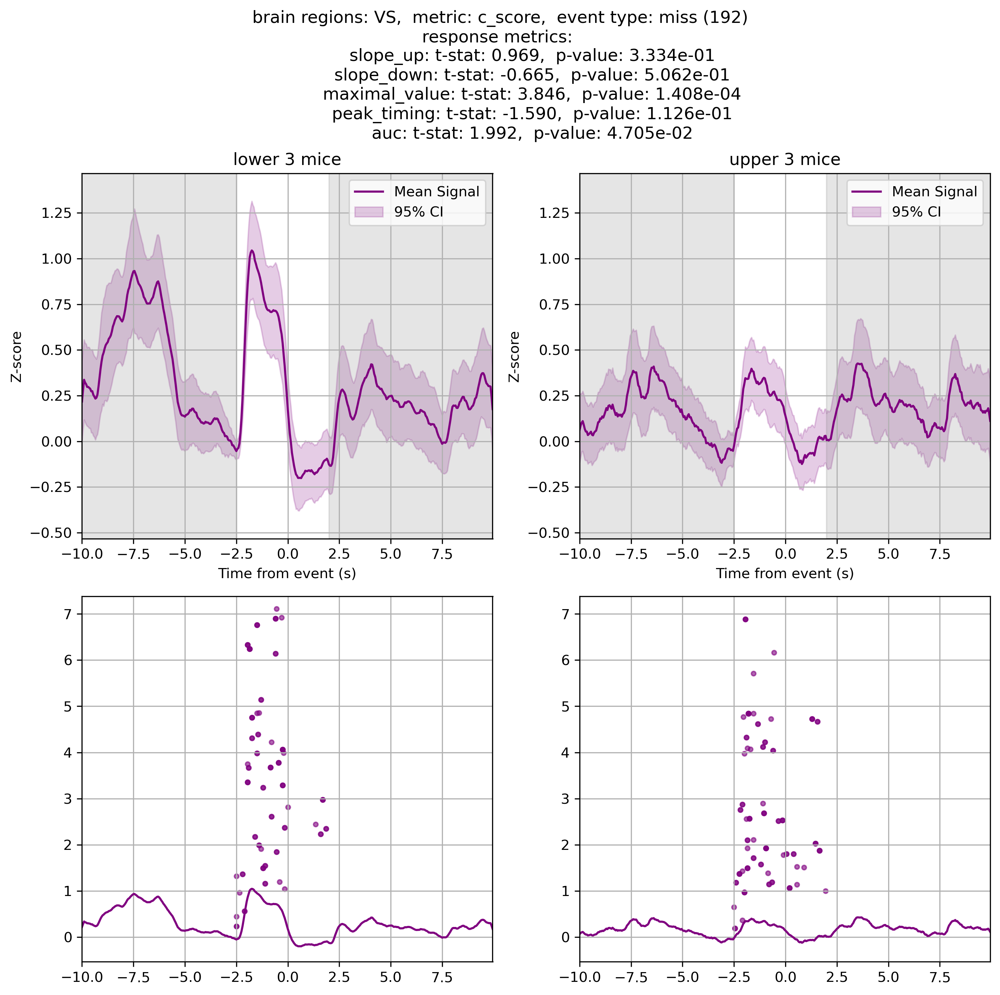

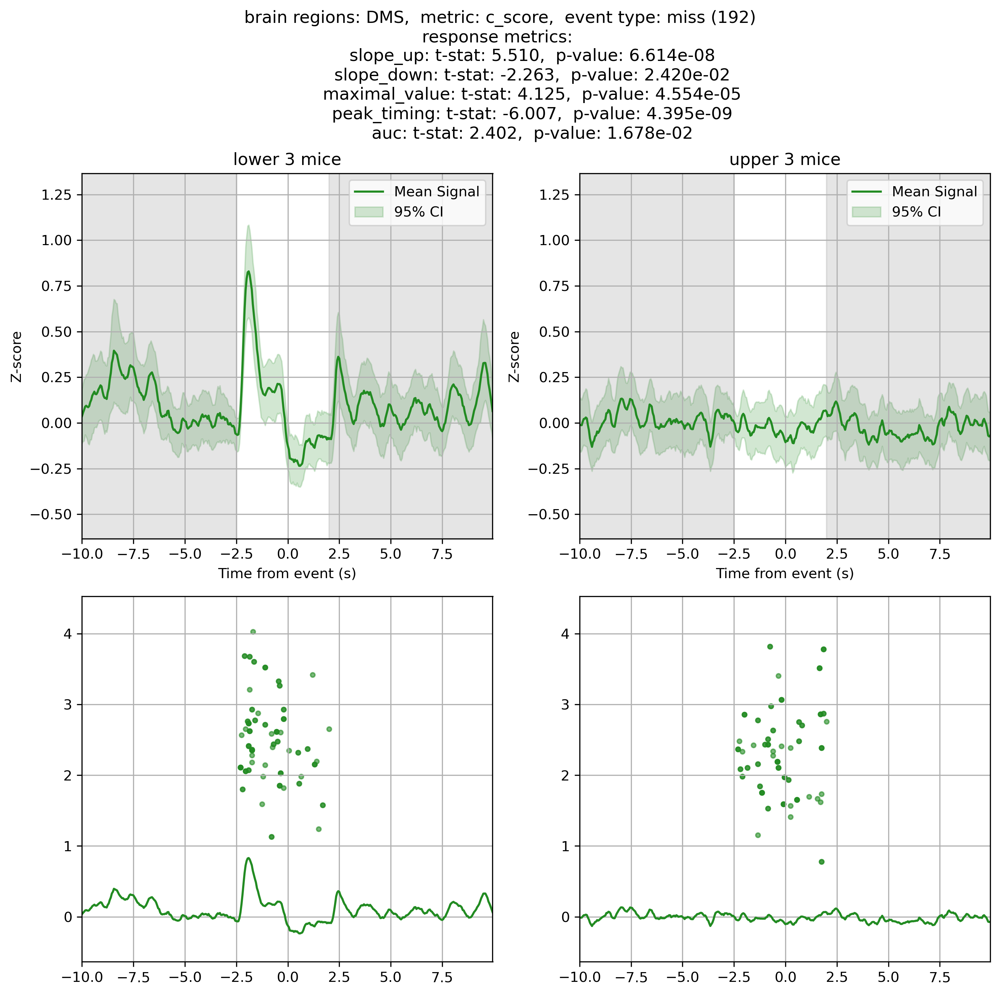

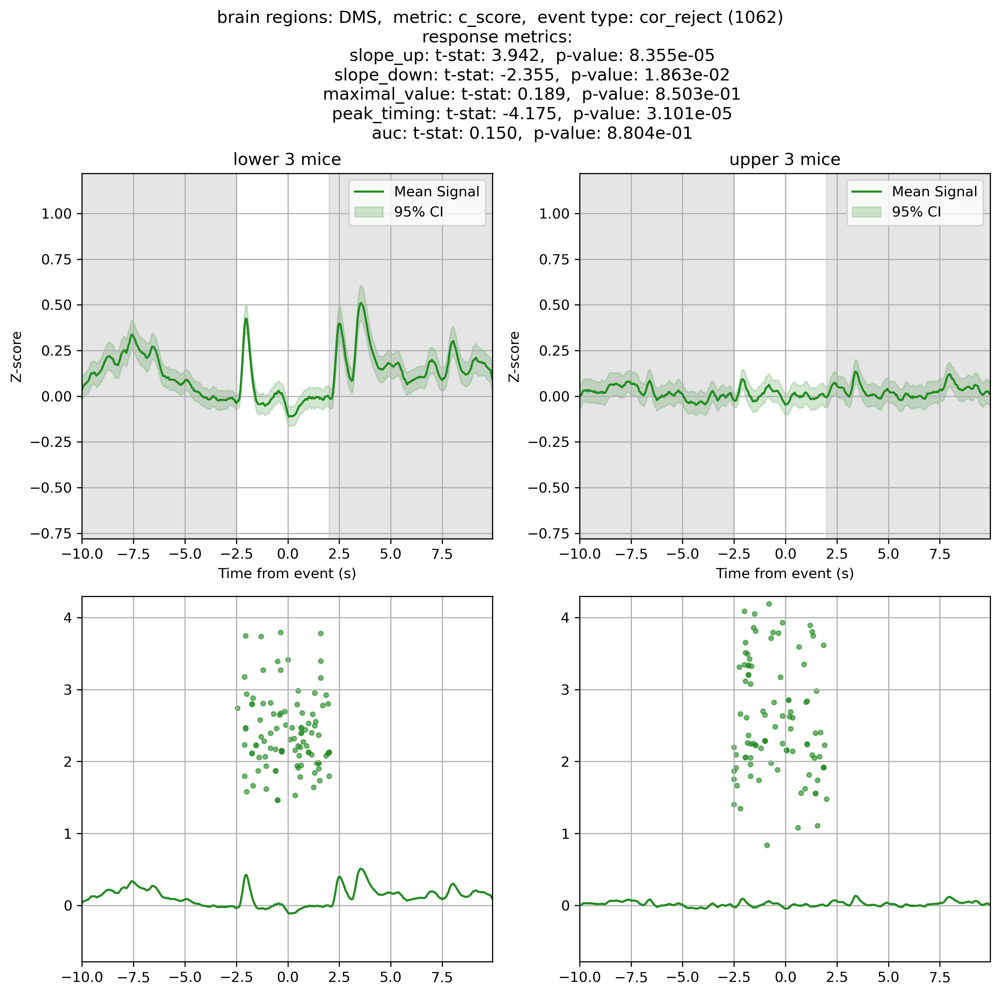

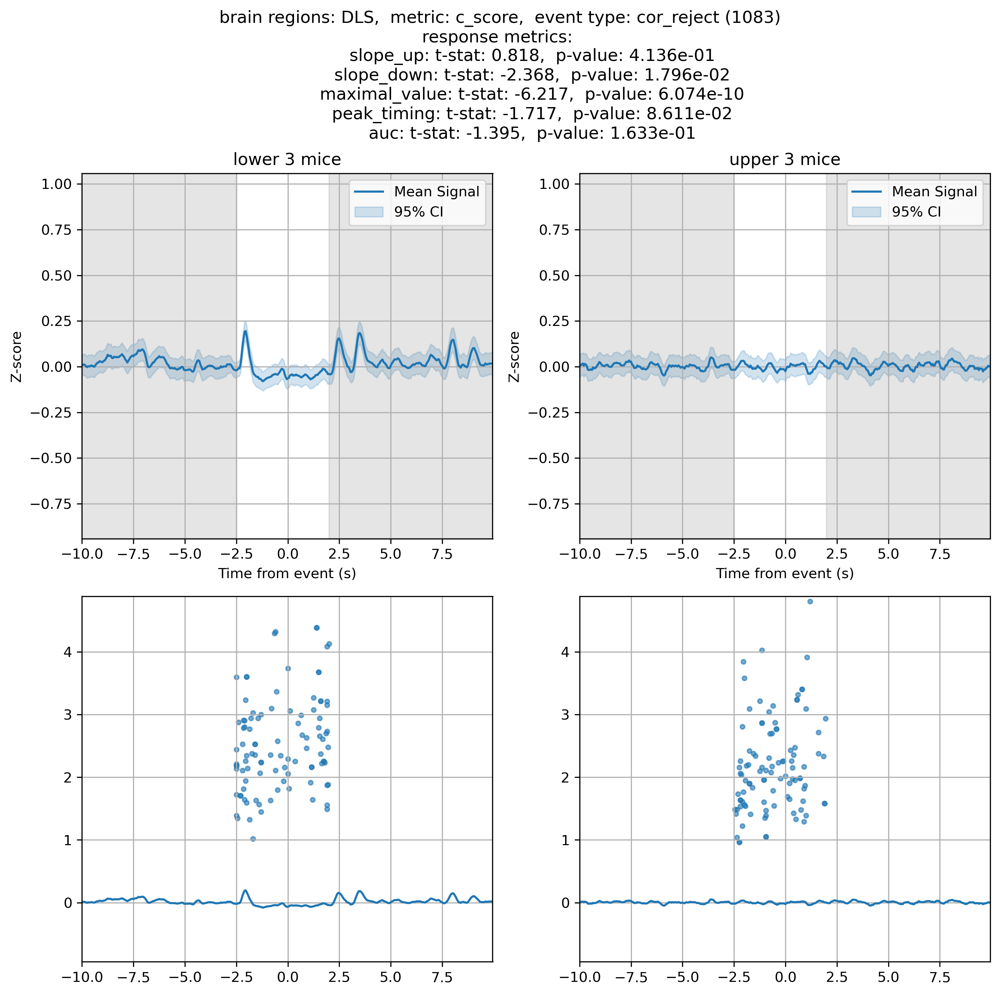

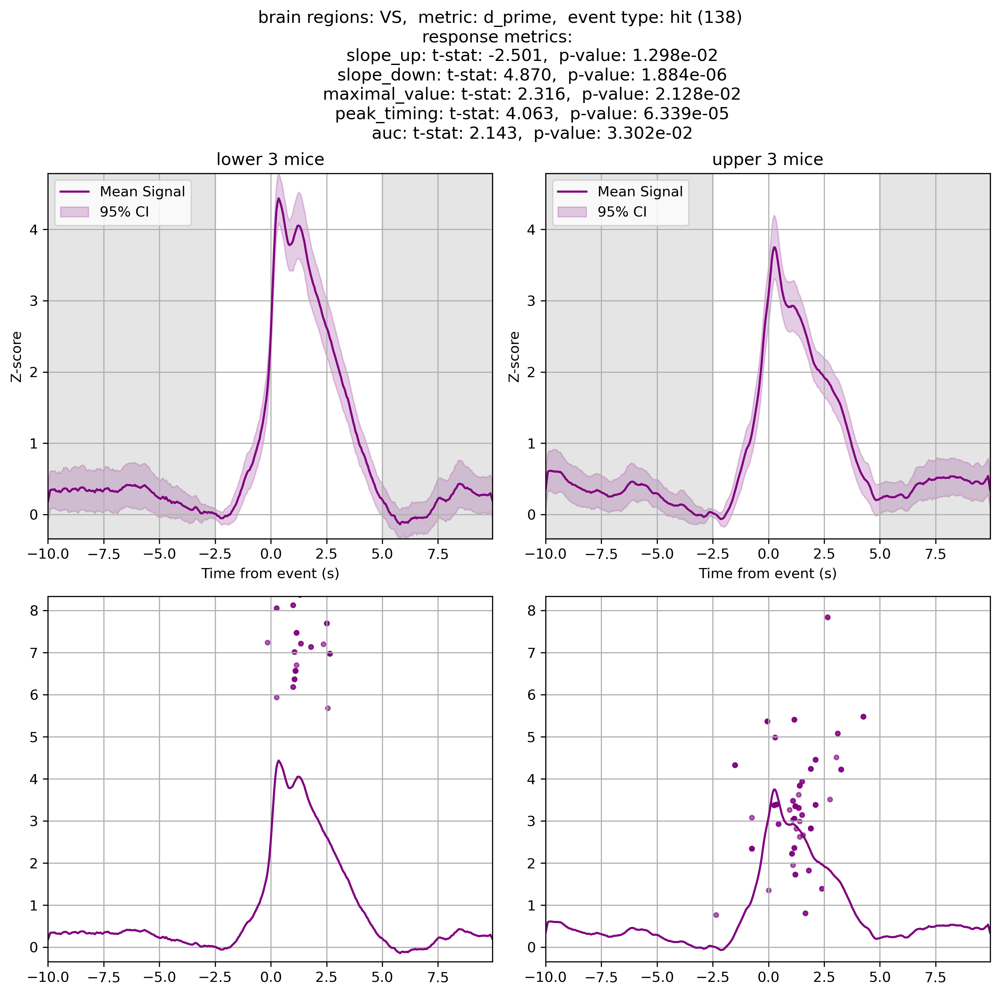

...

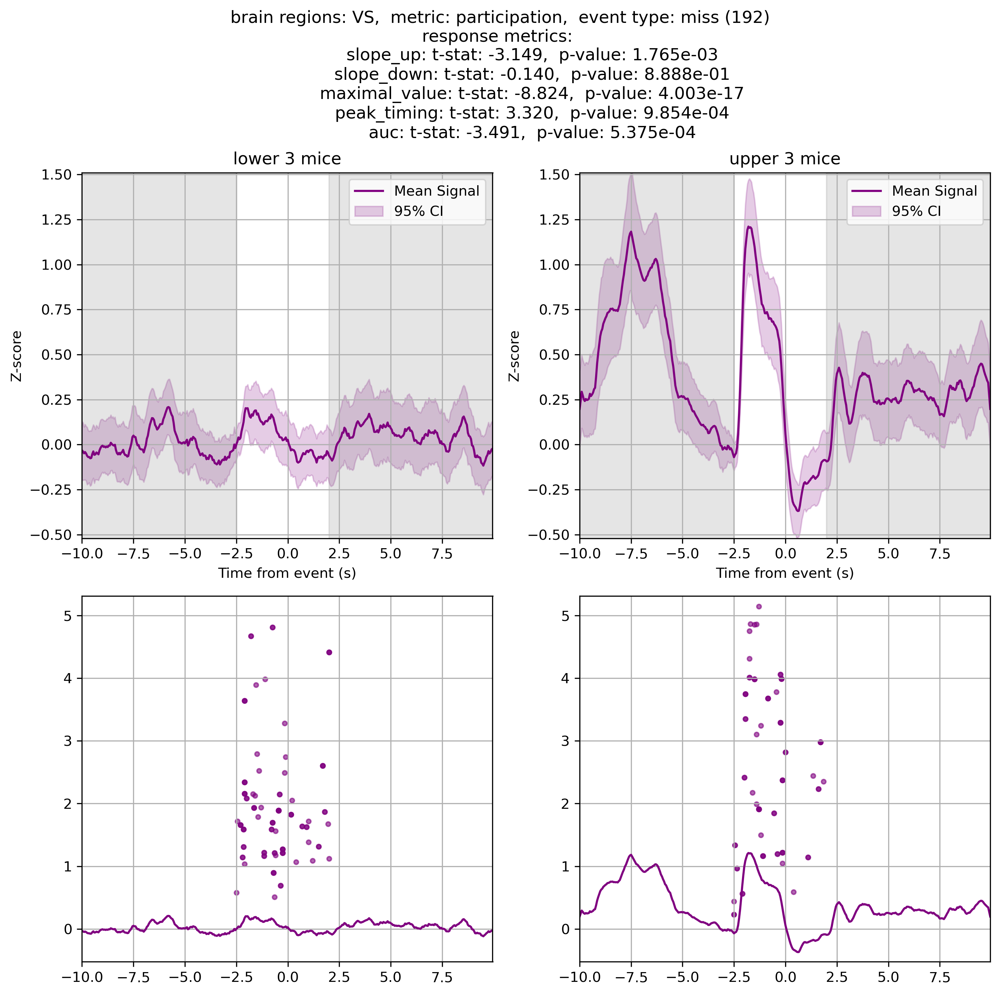

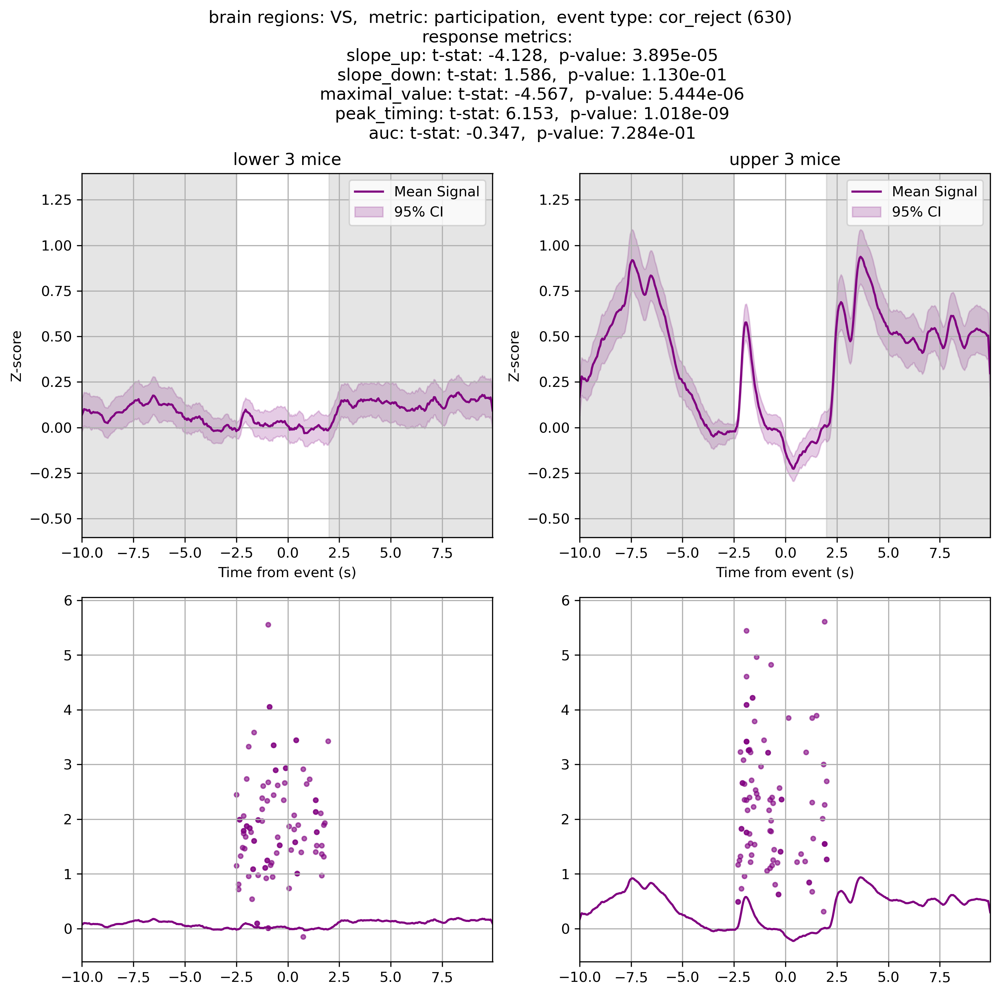

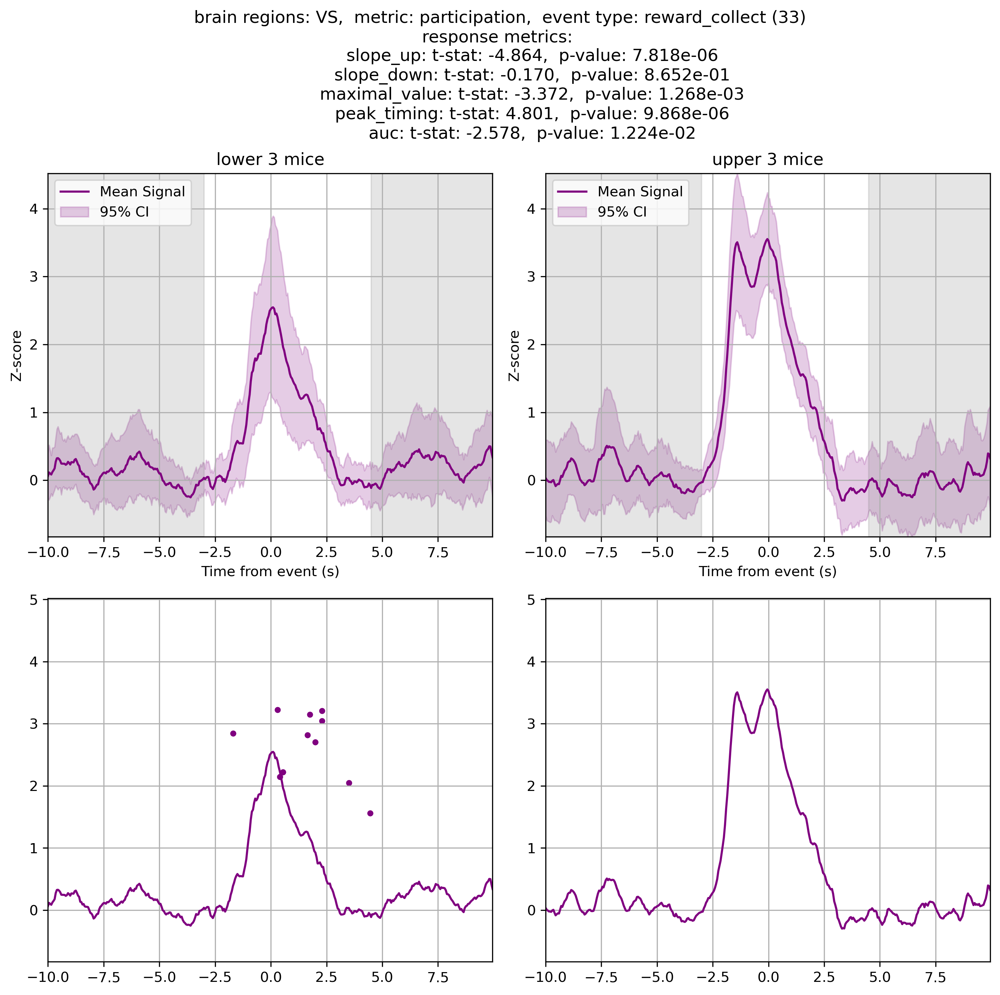

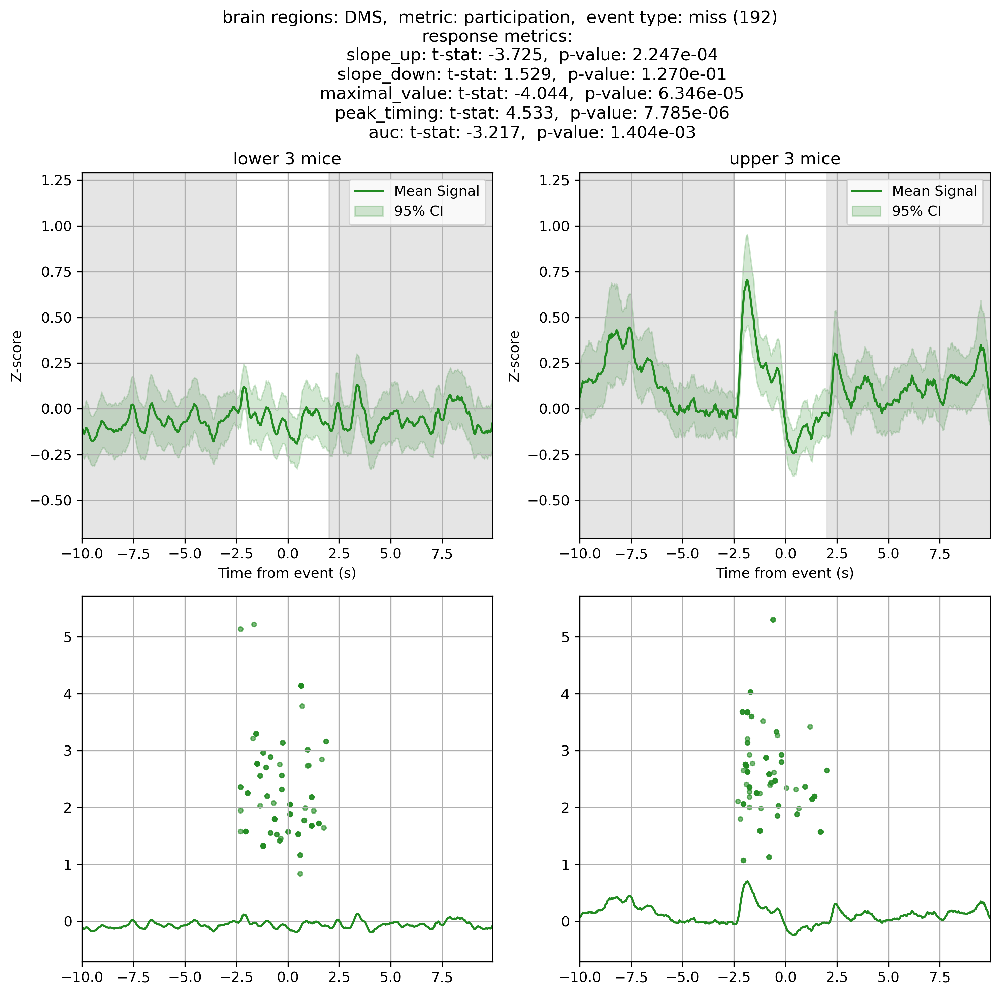

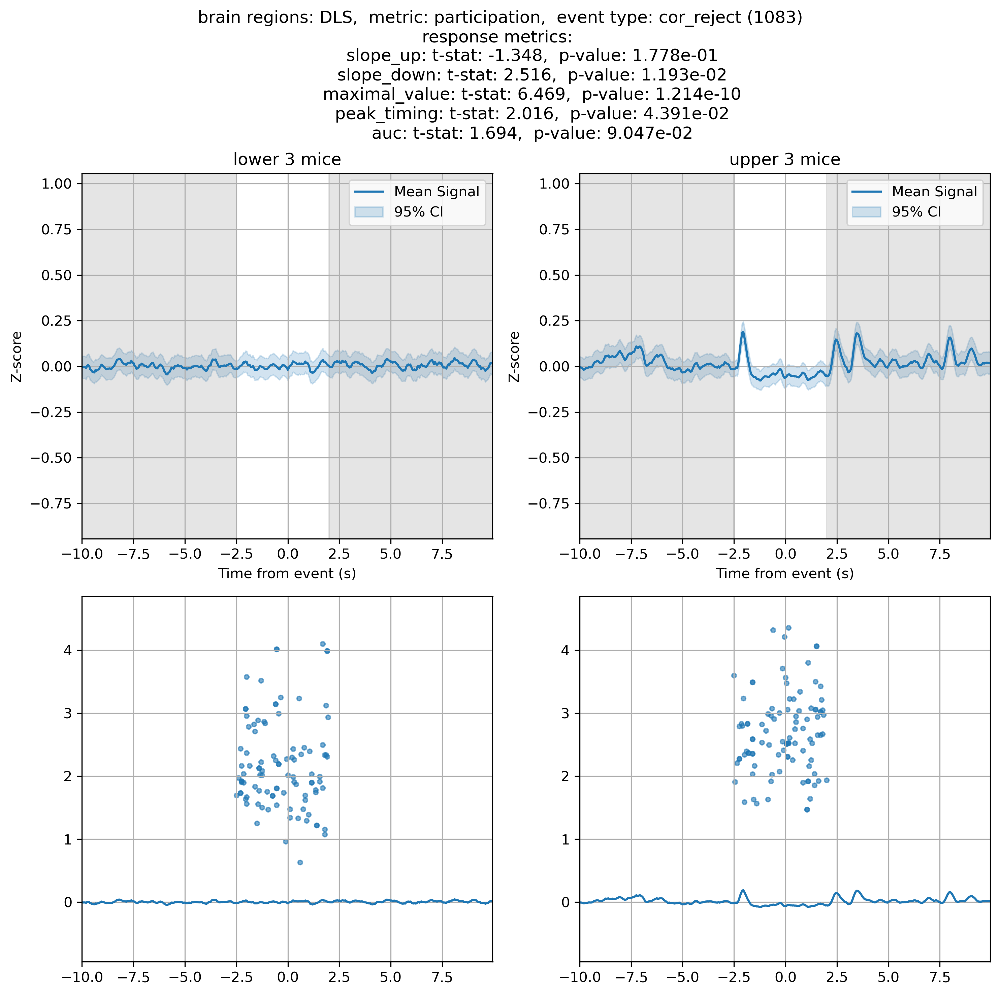

In [23]:
import itertools
import numpy as np
from scipy.stats import ttest_ind
from utils import mouse_br_events_count

brain_reg_to_color = {'VS': 'purple',
                      'DMS': 'forestgreen',
                      'DLS': 'C0'}

# Assuming config.all_metrics, config.all_brain_regions, and config.all_events are all iterable
for performance_metric, brain_region, event in itertools.product(all_metrics, all_brain_regions, all_event_types):
    weight_method = 'mice_events'
    low_sessions, high_sessions = \
        mouse_analyser.sample_high_and_low_sessions(performance_metric, brain_region, event)
    n = 1000

    if weight_method == 'mice_events':
        mouse_ids = {session.mouse_id for session in (low_sessions + high_sessions)}
        n = min(mouse_br_events_count(mouse_analyser.mice_dict[mouse_id], brain_region, event) for mouse_id in mouse_ids)

    low_signals, low_resp_metrics, resp_metric_names = sample_signals_and_metrics(low_sessions, event, brain_region, 
                                                                                  weight_method=weight_method, n=n)
    high_signals, high_resp_metrics, _ = sample_signals_and_metrics(high_sessions, event, brain_region, 
                                                                    weight_method=weight_method, n=n)

    if weight_method != 'mice_events':
        n = min(n, low_signals.shape[0], high_signals.shape[0])
        sample_idxs = np.random.choice(n, size=n, replace=False)

        low_signals = low_signals[sample_idxs]
        high_signals = high_signals[sample_idxs]

    sb = attr_interval_dict[event]

    scatters = [np.zeros((2, 100)), np.zeros((2, 100))]
    resp_metric_infos = []
    is_significant_p_vals = []

    low_sample_idxs = np.random.choice(n, size=100, replace=True)
    high_sample_idxs = np.random.choice(n, size=100, replace=True)
    for col_idx, resp_metric_name in resp_metric_names.items():
        low_resp_metric = low_resp_metrics[:, col_idx]
        high_resp_metric = high_resp_metrics[:, col_idx]

        if resp_metric_name == 'peak_timing':
            scatters[0][0] = (low_resp_metric + attr_interval_dict[event][0])[low_sample_idxs]
            scatters[1][0] = (high_resp_metric + attr_interval_dict[event][0])[high_sample_idxs]
        elif resp_metric_name == 'maximal_value':
            scatters[0][1] = low_resp_metric[low_sample_idxs]
            scatters[1][1] = high_resp_metric[high_sample_idxs]

        t_stat, p_value = ttest_ind(low_resp_metric, high_resp_metric, nan_policy='omit')
        resp_metric_infos.append(f"            {resp_metric_name}: t-stat: {t_stat:.3f},  p-value: {p_value:.3e}")
        is_significant_p_vals.append(p_value <= 1/3000)
        if p_value > 1/3000:
            continue
    if not any(is_significant_p_vals):
        continue

    suptitle = f"brain regions: {brain_region},  metric: {performance_metric},  event type: {event} ({low_signals.shape[0]})\nresponse metrics: "
    for resp_metric_info in resp_metric_infos:
        suptitle += f"\n{resp_metric_info}"

    low_subtitle = f"lower 3 mice"
    high_subtitle = f"upper 3 mice"

    color = brain_reg_to_color[brain_region]
    plot_signals([low_signals, high_signals], [low_subtitle, high_subtitle], suptitle, color, 
                    5, sb, scatters=scatters, fname=f'{performance_metric}_{brain_region}_{event}.png')